In [1]:
import torch
# torch.autograd.set_detect_anomaly(True)
from torch.utils.data import DataLoader,WeightedRandomSampler
from torch.optim.lr_scheduler import PolynomialLR
import torch.nn.functional as F
from torchvision.transforms import v2

import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp

from tqdm.notebook import tqdm
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import os
###IE###
%load_ext autoreload
%autoreload 2
from utils.helpers import (
    plot_some_images ,read_images ,
    pre_hard_skeletonize , pre_soft_skeletonize,
    compute_confution_matrix,draw_mask,TP_TN_FP_FN,)
from utils.preprocessing import (
    WhiteTopHat , CLAHE , normalize_xca,
    BrightnessMultiplicativeNNUNet2D,
    ContrastAugmentationNNUNet2D)
from utils.dataset import  TrainUnetDataset  , ValidUnetDataset , collate_fn_train , collate_fn_test
from models.nnunet import nnUnet
from utils.losses import UnetLoss
from utils.recorder import HistoryRecorder
from logger import save_full_report
from trainer import trainer
###SS###
from trainer import evaluation


In [2]:
args = {
    "base_path" : "./dataset/syntax/",
    "in_c" : 2,
    "base_channel" :32,
    "image_shape" : (448,448),
    "class_count" : 26 ,
    "attention" : False,
    "k":40,
    "batch_size" : 2,
    "num_workers" : 5,
    "device" : "cuda" if torch.cuda.is_available() else "cpu",
    "lr" : 0.01,
    "momentum" : 0.99,
    "weight_decay" : 3e-5,
    "epcohs":50,
    "f_int_scale" : 2,
    "full_report_cycle" : 10,
    "max_channels":512,
    "loss_type":"tversky loss",
    "alpha":0.3,
    "beta":0.8,
    "t_gamma":2.00,
    "f_gamma":2.0,
    "f_loss_scale":1,
    "output_base_path" : "./outputs",
    "name" : "seq-first",
    "deep_super_vision" : False,
    "f_alpha":None,
    "layer_count":5
}
class_map = {
    1: '1',2: '2', 3: '3',4: '4',
    5: '5',6: '6',7:'9',8:'7',9:'9a',
    10:'10',11:'8',12:'10a',13:'12',14:'11',
    15:'12a',16:'12b',17:'13',18:'14',19:'14a',
    20:'14b',21:'15',22:'16',
    23: '16a',24: '16b',25: '16c',
}
# losses_keys = ["total loss","FCE loss",args["loss_type"]]
losses_keys = ["total loss","CE loss",args["loss_type"]]
out_counts = args["layer_count"] if args["deep_super_vision"] else 1
loss_weights = [1/(2**i) for i in range(out_counts)]
loss_weights



[1.0]

In [3]:
b=0.999

train_class_counts = [
    1200,374,375,369,303,525,537,
    198,340,70,21,310,1,61,320,129,
    63,305,107,49,127,38,232,43,48,31
]
# f_alpha = (1-b)/(1-np.power(b,train_class_counts))
total = np.sum(train_class_counts)
f_alpha = np.log(total/np.array(train_class_counts))
f_alpha = (f_alpha / f_alpha.mean()).tolist()
# args["f_alpha"] = [0.1,1.75,1.5]
args["f_alpha"]=None
f_alpha


[0.4196132898803402,
 0.7182028607843546,
 0.7175189630226227,
 0.721650013218937,
 0.7721219167543302,
 0.6313418419654852,
 0.6255535829680703,
 0.8810920236198284,
 0.7426136620601264,
 1.1473979162000387,
 1.4557589006003677,
 0.7662722761297971,
 2.2355206465069903,
 1.1826454428915965,
 0.7581408134999629,
 0.9908276338197994,
 1.1743828050683243,
 0.7704369135741549,
 1.0387177833927879,
 1.2387493457578322,
 0.9948295833595646,
 1.3038636813131317,
 0.8405046696823193,
 1.2722037293518427,
 1.2440303485152229,
 1.3560093560621693]

In [4]:
# args["t_alpha"] = [1,0.8]
args["t_alpha"] = None

In [5]:
train_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
        A.Downscale(
        scale_range=[0.7, 1],
        interpolation_pair={"downscale": 0, "upscale": 0},
        p=0.5
    ),
    A.GaussNoise(
        std_range=[0.0, 0.1],
        mean_range=[0, 0],
        per_channel=True,
        noise_scale_factor=1,
        p=0.5
    ),
    A.GaussianBlur(
        sigma_limit=[1.0,1.5],
        blur_limit = (3,7),
        p=0.5
    ),

    A.OneOf([
        A.ElasticTransform(
            alpha=120, 
            sigma=120 * 0.05, 
            p=1.0
        ),
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=1.0),
        A.OpticalDistortion(distort_limit=0.2, p=1.0),
    ], p=0.5),
    A.Compose([
        A.InvertImg(p=1.0),
        A.RandomGamma(gamma_limit=(70, 150), p=1.0),
        A.InvertImg(p=1.0),
    ], p=0.5),
    BrightnessMultiplicativeNNUNet2D(multiplier_range=(0.70, 1.3), p=0.5),
    ContrastAugmentationNNUNet2D(contrast_range=(0.65, 1.5), p=0.5),
    A.RandomGamma(
        gamma_limit=(90, 120), 
        p=0.5
    ),
    A.Affine(
        scale=(0.7, 1.4),  
        translate_percent=(0, 0),
        rotate=0,               
        shear=0,                 
        fit_output=False, 
        p=0.5
    ),
    A.Rotate(limit=30, p=0.5, fill_mask = 0),
    A.Rotate(limit=-30, p=0.5, fill_mask = 0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),

    A.Lambda(image=normalize_xca),

    ]
)
test_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    A.Lambda(image=normalize_xca),


    ]  
)

train_preprocess = None


/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:47: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)
/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:60: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)


In [6]:
train_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "train",chosen_labels=[19,25])
valid_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "val",chosen_labels=[19,25])


NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/1000 [00:00<?, ?it/s]

NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/200 [00:00<?, ?it/s]

In [7]:

train_ds = TrainUnetDataset(transform = train_transforms,data = train_images)
valid_ds = ValidUnetDataset(transform = test_transforms,data = valid_images)
# sampler = WeightedRandomSampler(
#     weights=sampler_weights, 
#     num_samples=len(sampler_weights),
#     replacement=True)

train_loader = DataLoader(
    train_ds,
    batch_size = args["batch_size"] ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=True,
    collate_fn=collate_fn_train
    # sampler=sampler
)
valid_loader = DataLoader(
    valid_ds,
    batch_size = args["batch_size"]  ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=False,
    collate_fn=collate_fn_test
)


In [8]:
# contexts , targets = next(iter(train_loader))
# context = contexts[0]
# target = targets[0]
# plt.figure(figsize=(10,10))
# for i in range(context.shape[0]):
    
#     plt.subplot(3,3,i+1)
#     plt.imshow(context[i][0])
    
# plt.figure(figsize=(10,10))
# for i in range(target.shape[0]):
#     print(np.unique(target[i]))
#     plt.subplot(3,3,i+1)
#     plt.imshow(target[i])

In [9]:
class Unet(torch.nn.Module):
    def __init__(self, args):
        super(Unet,self).__init__()
        self.model = smp.Unet(
            encoder_name="resnet18",     # Reliable backbone
            encoder_weights="imagenet",  # Start with pre-trained edges
            in_channels=1,               # Grayscale adaptation
            classes=3,                   # Bg, 14b, 15
            encoder_depth=3,

            decoder_channels=(64, 32, 16) 
        )
        # for param in self.model.encoder.parameters():
        #     param.requires_grad = False
        # for param in self.model.encoder.features[-1].parameters():
        #     param.requires_grad = True
    def forward(self,x):
        return [self.model(x)]
    

In [10]:

model = nnUnet(args).to(args["device"])

# model = Unet(args).to(args["device"])


loss_fn = UnetLoss(args)
# optimizer = torch.optim.Adam(model.parameters(), lr=args["lr"])
optimizer = torch.optim.SGD(
    model.parameters(),
    momentum=args["momentum"],
    lr=args["lr"],
    nesterov=True,
    weight_decay=args["weight_decay"]
)
# optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-2)
lr_sch = PolynomialLR(optimizer=optimizer,total_iters=args["epcohs"],power=0.9)
recorder = HistoryRecorder(losses_keys=losses_keys,class_maps =class_map,class_count=args["class_count"]-1)


best_model = trainer(
    args=args,
    recorder = recorder,
    model = model,
    optimizer = optimizer,
    loss_fn = loss_fn,
    train_loader = train_loader,
    valid_loader = valid_loader,
    loss_weights=loss_weights,
    lr_sch = lr_sch
)




number of layers : 5
encoder settings :  [32, 64, 128, 256, 512]
bottle-neck settings :  1024
decoder settings :  [512, 256, 128, 64]
head settings :  26
loss is set to tversky


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.4042, device='cuda:0')
current lr : 0.01
train ==> epcoh (0)
total loss : 1.1213477671146392 - CE loss : 0.12262243824452161 - tversky loss : 0.9987253299951553

train avg metrics for epoch 0 :
avg dice : 0.00042434135458129673 - avg precision : 0.003631117549375631 - avg recall : 0.0002476527597173117
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (0)
total loss : 1.051347496509552 - CE loss : 0.05413633156567812 - tversky loss : 0.9972111630439758

valid avg metrics for epoch 0 :
avg dice : 3.2511079560998984e-06 - avg precision : 0.002025316506624222 - avg recall : 1.6268594481516628e-06
------------------------------------------------------------
New Best! : dice = 3.2511079552932642e-06


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.0763, device='cuda:0')
current lr : 0.00982
train ==> epcoh (1)
total loss : 1.0419008600711823 - CE loss : 0.04745813236013055 - tversky loss : 0.994442727446556

train avg metrics for epoch 1 :
avg dice : 0.00042249623744050244 - avg precision : 0.005131375789642334 - avg recall : 0.00022031815722584725
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (1)
total loss : 1.0458886921405792 - CE loss : 0.05075457036495209 - tversky loss : 0.9951341158151626

valid avg metrics for epoch 1 :
avg dice : 0.0007596429442877185 - avg precision : 0.007779214978218079 - avg recall : 0.00039931822568178176
------------------------------------------------------------
New Best! : dice = 0.0007596429204568267


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.009639
train ==> epcoh (2)
total loss : 1.0324053555727004 - CE loss : 0.042665772397071124 - tversky loss : 0.9897395837306976

train avg metrics for epoch 2 :
avg dice : 0.002860001028028108 - avg precision : 0.004318692684173584 - avg recall : 0.002137899100780487
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (2)
total loss : 1.054024465084076 - CE loss : 0.05999965496361256 - tversky loss : 0.9940248113870621

valid avg metrics for epoch 2 :
avg dice : 0.00367975443656391 - avg precision : 0.006197724342346191 - avg recall : 0.002616670727729797
------------------------------------------------------------
New Best! : dice = 0.0036797544453293085


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.009458
train ==> epcoh (3)
total loss : 1.026524059176445 - CE loss : 0.04026620915904641 - tversky loss : 0.9862578498125076

train avg metrics for epoch 3 :
avg dice : 0.008683547974200758 - avg precision : 0.013587509393692016 - avg recall : 0.006778159141540527
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (3)
total loss : 1.0546296644210815 - CE loss : 0.06269159905612469 - tversky loss : 0.9919380640983582

valid avg metrics for epoch 3 :
avg dice : 0.002529173964246777 - avg precision : 0.009688996821641921 - avg recall : 0.004181235788855701
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.009277
train ==> epcoh (4)
total loss : 1.0224874087572098 - CE loss : 0.03886711660400033 - tversky loss : 0.9836202937364579

train avg metrics for epoch 4 :
avg dice : 0.008847377679174229 - avg precision : 0.010161338448524475 - avg recall : 0.013600493989943062
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (4)
total loss : 1.0440027523040771 - CE loss : 0.05374218817800283 - tversky loss : 0.9902605658769608

valid avg metrics for epoch 4 :
avg dice : 0.0026274780678410504 - avg precision : 0.016704188883304594 - avg recall : 0.004064593180082739
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.1094, device='cuda:0')
--- Total Norm ---
tensor(0.1522, device='cuda:0')
current lr : 0.009095
train ==> epcoh (5)
total loss : 1.0195493115186691 - CE loss : 0.03806503195874393 - tversky loss : 0.9814842804670334

train avg metrics for epoch 5 :
avg dice : 0.009413456510431866 - avg precision : 0.010326097309589386 - avg recall : 0.017750919281606912
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (5)
total loss : 1.040534120798111 - CE loss : 0.052094728481024505 - tversky loss : 0.9884394061565399

valid avg metrics for epoch 5 :
avg dice : 0.0039881322986526834 - avg precision : 0.010227090418338776 - avg recall : 0.008410405433678533
------------------------------------------------------------
New Best! : dice = 0.00398813234642148


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.2186, device='cuda:0')
current lr : 0.008913
train ==> epcoh (6)
total loss : 1.016883005976677 - CE loss : 0.03705730505101383 - tversky loss : 0.9798257021903992

train avg metrics for epoch 6 :
avg dice : 0.009228483439055486 - avg precision : 0.006039313077926636 - avg recall : 0.019554710388183592
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (6)
total loss : 1.0412891554832457 - CE loss : 0.054646785743534564 - tversky loss : 0.9866423630714416

valid avg metrics for epoch 6 :
avg dice : 0.005285820365498597 - avg precision : 0.0033004680275917054 - avg recall : 0.013265508413314819
------------------------------------------------------------
New Best! : dice = 0.005285820458084345


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.008731
train ==> epcoh (7)
total loss : 1.0142660998106003 - CE loss : 0.036389419691637157 - tversky loss : 0.9778766791820526

train avg metrics for epoch 7 :
avg dice : 0.00960464017080186 - avg precision : 0.018535632491111755 - avg recall : 0.021493120996747165
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (7)
total loss : 1.0385887694358826 - CE loss : 0.05344286162406206 - tversky loss : 0.9851459103822708

valid avg metrics for epoch 7 :
avg dice : 0.003547674995458562 - avg precision : 0.0038980945944786074 - avg recall : 0.01026320869103074
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.008548
train ==> epcoh (8)
total loss : 1.0135492728948594 - CE loss : 0.036075584454461934 - tversky loss : 0.9774736880064011

train avg metrics for epoch 8 :
avg dice : 0.011648847610345523 - avg precision : 0.01585448205471039 - avg recall : 0.02319749668240547
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (8)
total loss : 1.0431608605384826 - CE loss : 0.05819120854139328 - tversky loss : 0.984969652891159

valid avg metrics for epoch 8 :
avg dice : 0.0032097774935726715 - avg precision : 0.006049814224243164 - avg recall : 0.008611333803273738
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.008364
train ==> epcoh (9)
total loss : 1.009324334025383 - CE loss : 0.035412977749481794 - tversky loss : 0.9739113563299179

train avg metrics for epoch 9 :
avg dice : 0.018615126014460304 - avg precision : 0.014645863771438599 - avg recall : 0.027605297565460204
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (9)
total loss : 1.0417839038372039 - CE loss : 0.06368939947336912 - tversky loss : 0.9780945092439651

valid avg metrics for epoch 9 :
avg dice : 0.012294499511438812 - avg precision : 0.016305974572896956 - avg recall : 0.024879575995728372
1 => dice : 1.0167871590267136e-13 p : 0.0 , r : 0.0
2 => dice : 0.21910643577575684 p : 0.1433572918176651 , r : 0.4645964503288269
3 => dice : 0.0863054096698761 p : 0.05959409102797508 , r : 0.15641295909881592
4 => dice : 1.4922255325931083e-13 p : 0.0 , r : 0.0
5 => dice : 0.0019506423268467188 p : 0.20469798147678375 , r : 0.000979990465566516
6 => dice : 7.378385418919595e-14 p : 0.0 , r

  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.1593, device='cuda:0')
current lr : 0.008181
train ==> epcoh (10)
total loss : 0.9937525961399079 - CE loss : 0.03649720594845712 - tversky loss : 0.9572553925514221

train avg metrics for epoch 10 :
avg dice : 0.047176256776581535 - avg precision : 0.05949761629104614 - avg recall : 0.05837234824895859
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (10)
total loss : 1.0302831971645354 - CE loss : 0.06769290097057819 - tversky loss : 0.9625903022289276

valid avg metrics for epoch 10 :
avg dice : 0.024523967298836262 - avg precision : 0.021685425266623495 - avg recall : 0.04008577798191254
------------------------------------------------------------
New Best! : dice = 0.024523966014385223


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.007996
train ==> epcoh (11)
total loss : 0.9846367418766022 - CE loss : 0.037930683894082905 - tversky loss : 0.9467060580253601

train avg metrics for epoch 11 :
avg dice : 0.06187563896235923 - avg precision : 0.0643136215209961 - avg recall : 0.07436039388179778
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (11)
total loss : 1.0341381269693375 - CE loss : 0.07603663921356202 - tversky loss : 0.9581014913320541

valid avg metrics for epoch 11 :
avg dice : 0.02914264201240153 - avg precision : 0.030882044434547423 - avg recall : 0.048465212136507035
------------------------------------------------------------
New Best! : dice = 0.02914264239370823


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.3423, device='cuda:0')
current lr : 0.007811
train ==> epcoh (12)
total loss : 0.9770801992416381 - CE loss : 0.03739100061915815 - tversky loss : 0.9396891980171204

train avg metrics for epoch 12 :
avg dice : 0.06668206751405262 - avg precision : 0.06643368124961853 - avg recall : 0.0818116569519043
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (12)
total loss : 1.0323304975032805 - CE loss : 0.07561265893280505 - tversky loss : 0.9567178392410278

valid avg metrics for epoch 12 :
avg dice : 0.02669789299422414 - avg precision : 0.032933193743228915 - avg recall : 0.04418321432545781
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.0830, device='cuda:0')
current lr : 0.007626
train ==> epcoh (13)
total loss : 0.9716348308324814 - CE loss : 0.03750481588765979 - tversky loss : 0.9341300157308579

train avg metrics for epoch 13 :
avg dice : 0.07455610036928997 - avg precision : 0.07068069338798523 - avg recall : 0.08860815286636353
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (13)
total loss : 1.0234942990541458 - CE loss : 0.07448240876197815 - tversky loss : 0.949011892080307

valid avg metrics for epoch 13 :
avg dice : 0.03320880353504331 - avg precision : 0.04874257683753967 - avg recall : 0.03966171815991402
------------------------------------------------------------
New Best! : dice = 0.033208802342414856


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.00744
train ==> epcoh (14)
total loss : 0.9669241890907287 - CE loss : 0.036767683984711766 - tversky loss : 0.9301565028429032

train avg metrics for epoch 14 :
avg dice : 0.07525402316713735 - avg precision : 0.07088988225907088 - avg recall : 0.09108388629243563
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (14)
total loss : 1.024807191491127 - CE loss : 0.0703132214397192 - tversky loss : 0.9544939690828323

valid avg metrics for epoch 14 :
avg dice : 0.04051078941726301 - avg precision : 0.05618698835372925 - avg recall : 0.051485074013471605
------------------------------------------------------------
New Best! : dice = 0.040510788559913635


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.007254
train ==> epcoh (15)
total loss : 0.964611053943634 - CE loss : 0.03646191676333547 - tversky loss : 0.9281491366624832

train avg metrics for epoch 15 :
avg dice : 0.08073474246816499 - avg precision : 0.07636601470410824 - avg recall : 0.09461324670584872
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (15)
total loss : 1.029718633890152 - CE loss : 0.0763697912544012 - tversky loss : 0.9533488428592682

valid avg metrics for epoch 15 :
avg dice : 0.038624680899616216 - avg precision : 0.0460576955974102 - avg recall : 0.04750391924753785
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.1968, device='cuda:0')
--- Total Norm ---
tensor(0.2874, device='cuda:0')
current lr : 0.007067
train ==> epcoh (16)
total loss : 0.9564783645868301 - CE loss : 0.03548369814269245 - tversky loss : 0.9209946655035018

train avg metrics for epoch 16 :
avg dice : 0.09089935392179348 - avg precision : 0.08779974102973938 - avg recall : 0.1046539779752493
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (16)
total loss : 1.0182478231191636 - CE loss : 0.06976154435425996 - tversky loss : 0.9484862726926804

valid avg metrics for epoch 16 :
avg dice : 0.05353404104762886 - avg precision : 0.06418051183223725 - avg recall : 0.05602157428860664
------------------------------------------------------------
New Best! : dice = 0.053534042090177536


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.00688
train ==> epcoh (17)
total loss : 0.9527062306404114 - CE loss : 0.03578104971535504 - tversky loss : 0.9169251809120178

train avg metrics for epoch 17 :
avg dice : 0.10050577123481784 - avg precision : 0.09952581405639649 - avg recall : 0.10805146311991848
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (17)
total loss : 1.0182903331518174 - CE loss : 0.07240895461291075 - tversky loss : 0.9458813792467118

valid avg metrics for epoch 17 :
avg dice : 0.04713203206711624 - avg precision : 0.052186985611915586 - avg recall : 0.05399185925722122
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.006692
train ==> epcoh (18)
total loss : 0.9494017553329468 - CE loss : 0.03501874539814889 - tversky loss : 0.9143830089569092

train avg metrics for epoch 18 :
avg dice : 0.11137210107465158 - avg precision : 0.11143848299980164 - avg recall : 0.11719995829742402
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (18)
total loss : 1.0045470064878463 - CE loss : 0.07142606316134334 - tversky loss : 0.9331209379434585

valid avg metrics for epoch 18 :
avg dice : 0.05867395237141464 - avg precision : 0.08132697224617004 - avg recall : 0.05995929807424545
------------------------------------------------------------
New Best! : dice = 0.058673955500125885


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.006504
train ==> epcoh (19)
total loss : 0.9411240801811218 - CE loss : 0.03407383038289845 - tversky loss : 0.90705024933815

train avg metrics for epoch 19 :
avg dice : 0.11973989273938768 - avg precision : 0.12006591290235519 - avg recall : 0.12588648945093156
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (19)
total loss : 1.0157398331165313 - CE loss : 0.07574789632111788 - tversky loss : 0.9399919348955155

valid avg metrics for epoch 19 :
avg dice : 0.04810288563423965 - avg precision : 0.07327780663967133 - avg recall : 0.05527483105659485
1 => dice : 0.22565196454524994 p : 0.5064381957054138 , r : 0.14516669511795044
2 => dice : 0.03235789015889168 p : 0.3160763084888458 , r : 0.01705177128314972
3 => dice : 0.2762054204940796 p : 0.20653340220451355 , r : 0.41681331396102905
4 => dice : 1.4922255325931083e-13 p : 0.0 , r : 0.0
5 => dice : 0.33658698201179504 p : 0.5678324699401855 , r : 0.23918195068836212
6 => dice : 0.3317698836

  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.1417, device='cuda:0')
current lr : 0.006314
train ==> epcoh (20)
total loss : 0.9325032459497452 - CE loss : 0.03394217529334128 - tversky loss : 0.8985610704421997

train avg metrics for epoch 20 :
avg dice : 0.12441369891203094 - avg precision : 0.11999474883079529 - avg recall : 0.1326833498477936
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (20)
total loss : 1.0066411393880843 - CE loss : 0.0799250458739698 - tversky loss : 0.9267160946130752

valid avg metrics for epoch 20 :
avg dice : 0.04812811434322212 - avg precision : 0.07316534757614136 - avg recall : 0.05950385048985481
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.006125
train ==> epcoh (21)
total loss : 0.9303038556575776 - CE loss : 0.032874206494539975 - tversky loss : 0.8974296489953995

train avg metrics for epoch 21 :
avg dice : 0.1251255512243462 - avg precision : 0.11956719756126404 - avg recall : 0.13695672750473023
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (21)
total loss : 1.0009677398204804 - CE loss : 0.07960378635674716 - tversky loss : 0.9213639575242997

valid avg metrics for epoch 21 :
avg dice : 0.038494827971394995 - avg precision : 0.07070099413394929 - avg recall : 0.052187394574284555
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.3594, device='cuda:0')
current lr : 0.005934
train ==> epcoh (22)
total loss : 0.9253307027816773 - CE loss : 0.03177497211098671 - tversky loss : 0.8935557315349579

train avg metrics for epoch 22 :
avg dice : 0.12976173844519512 - avg precision : 0.12451918065547943 - avg recall : 0.14450161483633564
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (22)
total loss : 1.0093962866067887 - CE loss : 0.08807475134730339 - tversky loss : 0.9213215351104737

valid avg metrics for epoch 22 :
avg dice : 0.05773213257134715 - avg precision : 0.08032667636871338 - avg recall : 0.07170704108779319
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.005743
train ==> epcoh (23)
total loss : 0.9176513404846192 - CE loss : 0.03170574398525059 - tversky loss : 0.8859455962181091

train avg metrics for epoch 23 :
avg dice : 0.14796932477559774 - avg precision : 0.19723607063293458 - avg recall : 0.15465902733732947
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (23)
total loss : 1.0112790310382842 - CE loss : 0.09956523172557354 - tversky loss : 0.9117138016223908

valid avg metrics for epoch 23 :
avg dice : 0.04003386464488099 - avg precision : 0.06238553613424301 - avg recall : 0.05564487111754715
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.005551
train ==> epcoh (24)
total loss : 0.9082081081867218 - CE loss : 0.03340069559775293 - tversky loss : 0.8748074132204056

train avg metrics for epoch 24 :
avg dice : 0.17063958793936984 - avg precision : 0.17775921761989594 - avg recall : 0.17552808567881584
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (24)
total loss : 1.0008284664154052 - CE loss : 0.08848672311753035 - tversky loss : 0.9123417484760284

valid avg metrics for epoch 24 :
avg dice : 0.06843041893582652 - avg precision : 0.0992158729210496 - avg recall : 0.06803222246886435
------------------------------------------------------------
New Best! : dice = 0.06843041628599167


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.005359
train ==> epcoh (25)
total loss : 0.8954210973978043 - CE loss : 0.03353031591698527 - tversky loss : 0.8618907811641693

train avg metrics for epoch 25 :
avg dice : 0.19624771568074542 - avg precision : 0.21115903854370116 - avg recall : 0.20064202366862446
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (25)
total loss : 1.003024597764015 - CE loss : 0.09771601341664791 - tversky loss : 0.905308586359024

valid avg metrics for epoch 25 :
avg dice : 0.09525981225124612 - avg precision : 0.10809811875224114 - avg recall : 0.09633765384554863
------------------------------------------------------------
New Best! : dice = 0.09525980800390244


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.3665, device='cuda:0')
current lr : 0.005166
train ==> epcoh (26)
total loss : 0.8839928921461105 - CE loss : 0.03422790759056807 - tversky loss : 0.8497649856805801

train avg metrics for epoch 26 :
avg dice : 0.21992904365118712 - avg precision : 0.2268594652414322 - avg recall : 0.22113708317279815
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (26)
total loss : 0.9881053382158279 - CE loss : 0.09123173978179694 - tversky loss : 0.896873596906662

valid avg metrics for epoch 26 :
avg dice : 0.05405809562704664 - avg precision : 0.09144011486321688 - avg recall : 0.056951139064040035
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.2121, device='cuda:0')
current lr : 0.004971
train ==> epcoh (27)
total loss : 0.8736464592218399 - CE loss : 0.03378676065430045 - tversky loss : 0.8398596986532211

train avg metrics for epoch 27 :
avg dice : 0.22710980773025058 - avg precision : 0.22998387038707732 - avg recall : 0.2314681488275528
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (27)
total loss : 1.002368398308754 - CE loss : 0.10210087519139051 - tversky loss : 0.9002675235271453

valid avg metrics for epoch 27 :
avg dice : 0.09475004743835984 - avg precision : 0.12337159633636474 - avg recall : 0.10576839867047966
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.2198, device='cuda:0')
current lr : 0.004776
train ==> epcoh (28)
total loss : 0.867300831913948 - CE loss : 0.03262764287739992 - tversky loss : 0.8346731896400452

train avg metrics for epoch 28 :
avg dice : 0.23945810437257656 - avg precision : 0.23961876034736634 - avg recall : 0.24486714512109756
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (28)
total loss : 1.0175718754529952 - CE loss : 0.12148016065359116 - tversky loss : 0.8960917145013809

valid avg metrics for epoch 28 :
avg dice : 0.07727597872194808 - avg precision : 0.1119448242150247 - avg recall : 0.09375346819928382
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.004581
train ==> epcoh (29)
total loss : 0.8685974708795547 - CE loss : 0.03187859120965004 - tversky loss : 0.8367188801765442

train avg metrics for epoch 29 :
avg dice : 0.23981392026018167 - avg precision : 0.23818044900894164 - avg recall : 0.24775230556726455
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (29)
total loss : 1.0223590701818466 - CE loss : 0.10920019866898656 - tversky loss : 0.9131588751077652

valid avg metrics for epoch 29 :
avg dice : 0.08047424953132966 - avg precision : 0.10729910366237164 - avg recall : 0.07661693527305033
1 => dice : 0.3471148908138275 p : 0.6348747611045837 , r : 0.23885346949100494
2 => dice : 0.4132014811038971 p : 0.5065014958381653 , r : 0.34892737865448
3 => dice : 0.07386741042137146 p : 0.11719582974910736 , r : 0.05392925441265106
4 => dice : 0.0004147541767451912 p : 0.002820609137415886 , r : 0.00022383382020052522
5 => dice : 0.5360560417175293 p : 0.6899634599685669 , r : 0.4382887184

  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.2316, device='cuda:0')
--- Total Norm ---
tensor(0.2976, device='cuda:0')
current lr : 0.004384
train ==> epcoh (30)
total loss : 0.8643178740739822 - CE loss : 0.03233413864299655 - tversky loss : 0.8319837350845337

train avg metrics for epoch 30 :
avg dice : 0.2402548016518834 - avg precision : 0.24214697420597076 - avg recall : 0.24840536952018738
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (30)
total loss : 1.0102226114273072 - CE loss : 0.11010027471929788 - tversky loss : 0.9001223385334015

valid avg metrics for epoch 30 :
avg dice : 0.06853109231270041 - avg precision : 0.10694822989404201 - avg recall : 0.07840568725019693
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.8615, device='cuda:0')
current lr : 0.004186
train ==> epcoh (31)
total loss : 0.8555478816032409 - CE loss : 0.031889611976221206 - tversky loss : 0.8236582688093186

train avg metrics for epoch 31 :
avg dice : 0.262930019985398 - avg precision : 0.2693194356560707 - avg recall : 0.2694197435147362
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (31)
total loss : 1.0350150865316392 - CE loss : 0.12439849961549043 - tversky loss : 0.9106165844202042

valid avg metrics for epoch 31 :
avg dice : 0.0825959028401788 - avg precision : 0.10465939192101359 - avg recall : 0.07994019163190387
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.003987
train ==> epcoh (32)
total loss : 0.8489769114255905 - CE loss : 0.032108813110738994 - tversky loss : 0.8168680967092514

train avg metrics for epoch 32 :
avg dice : 0.27630675817022016 - avg precision : 0.2733311326429248 - avg recall : 0.28336437952995763
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (32)
total loss : 1.034004984498024 - CE loss : 0.14045982576906682 - tversky loss : 0.8935451620817184

valid avg metrics for epoch 32 :
avg dice : 0.09149666965057346 - avg precision : 0.13937060594558714 - avg recall : 0.0964377776067704
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.003787
train ==> epcoh (33)
total loss : 0.8406175063848496 - CE loss : 0.03142968650721013 - tversky loss : 0.809187818646431

train avg metrics for epoch 33 :
avg dice : 0.2890351084625255 - avg precision : 0.28732074618339537 - avg recall : 0.2970135109871626
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (33)
total loss : 1.025938949584961 - CE loss : 0.12863247945904732 - tversky loss : 0.8973064702749253

valid avg metrics for epoch 33 :
avg dice : 0.09030428116025918 - avg precision : 0.12950312736909836 - avg recall : 0.08449144186393824
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.4576, device='cuda:0')
current lr : 0.003586
train ==> epcoh (34)
total loss : 0.8450537531375885 - CE loss : 0.031855228690430525 - tversky loss : 0.8131985255479812

train avg metrics for epoch 34 :
avg dice : 0.29001391334980076 - avg precision : 0.29146916955709457 - avg recall : 0.2982837300980464
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (34)
total loss : 1.0258446317911147 - CE loss : 0.12671674616634845 - tversky loss : 0.8991278886795044

valid avg metrics for epoch 34 :
avg dice : 0.0895971432426251 - avg precision : 0.12414487600326538 - avg recall : 0.09539178463630378
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.003384
train ==> epcoh (35)
total loss : 0.8342854472398757 - CE loss : 0.03080080274678767 - tversky loss : 0.8034846450090408

train avg metrics for epoch 35 :
avg dice : 0.3057833243911633 - avg precision : 0.3004195508360863 - avg recall : 0.31806882709264755
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (35)
total loss : 1.028721118569374 - CE loss : 0.1352831671386957 - tversky loss : 0.8934379464387894

valid avg metrics for epoch 35 :
avg dice : 0.1063508053128907 - avg precision : 0.1536731891334057 - avg recall : 0.1062049589306116
------------------------------------------------------------
New Best! : dice = 0.10635080933570862


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.4006, device='cuda:0')
current lr : 0.00318
train ==> epcoh (36)
total loss : 0.8308441029787064 - CE loss : 0.030334130700677635 - tversky loss : 0.800509971857071

train avg metrics for epoch 36 :
avg dice : 0.3135797497263018 - avg precision : 0.30756152093410494 - avg recall : 0.3271727289073169
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (36)
total loss : 1.0299207466840743 - CE loss : 0.13577844593673943 - tversky loss : 0.8941422969102859

valid avg metrics for epoch 36 :
avg dice : 0.13090853367049124 - avg precision : 0.15429425083100795 - avg recall : 0.12474009789060801
------------------------------------------------------------
New Best! : dice = 0.1309085339307785


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.5204, device='cuda:0')
current lr : 0.002975
train ==> epcoh (37)
total loss : 0.8301798164844513 - CE loss : 0.0298143549868837 - tversky loss : 0.800365462064743

train avg metrics for epoch 37 :
avg dice : 0.3252975914433761 - avg precision : 0.3244930581748486 - avg recall : 0.3361365337802272
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (37)
total loss : 1.051834644675255 - CE loss : 0.15479181066155434 - tversky loss : 0.8970428347587586

valid avg metrics for epoch 37 :
avg dice : 0.12076588220942629 - avg precision : 0.1484973694384098 - avg recall : 0.12082936991006137
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.3446, device='cuda:0')
current lr : 0.002768
train ==> epcoh (38)
total loss : 0.8175534193515778 - CE loss : 0.02912016386911273 - tversky loss : 0.7884332556724548

train avg metrics for epoch 38 :
avg dice : 0.3273684608661306 - avg precision : 0.3239489957690239 - avg recall : 0.34159481144044546
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (38)
total loss : 1.0587695026397705 - CE loss : 0.1631477988883853 - tversky loss : 0.8956217092275619

valid avg metrics for epoch 38 :
avg dice : 0.1323771742381035 - avg precision : 0.1635763283306733 - avg recall : 0.12822216900181957
------------------------------------------------------------
New Best! : dice = 0.13237717747688293


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.1268, device='cuda:0')
current lr : 0.00256
train ==> epcoh (39)
total loss : 0.8192238105535508 - CE loss : 0.029371145470067857 - tversky loss : 0.7898526666164398

train avg metrics for epoch 39 :
avg dice : 0.3304619811758746 - avg precision : 0.32545641109347345 - avg recall : 0.34637517438626675
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (39)
total loss : 1.0481156754493712 - CE loss : 0.16111173067241907 - tversky loss : 0.8870039451122284

valid avg metrics for epoch 39 :
avg dice : 0.11413154359953884 - avg precision : 0.14202165827155114 - avg recall : 0.12312805112451315
1 => dice : 0.24464119970798492 p : 0.6290648579597473 , r : 0.1518469899892807
2 => dice : 0.16782432794570923 p : 0.2968272864818573 , r : 0.11698286235332489
3 => dice : 0.11179117858409882 p : 0.150231271982193 , r : 0.08901472389698029
4 => dice : 0.023857759311795235 p : 0.03837374597787857 , r : 0.01730981655418873
5 => dice : 0.57166379690

  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.3109, device='cuda:0')
current lr : 0.002349
train ==> epcoh (40)
total loss : 0.8170733729600906 - CE loss : 0.02868998884782195 - tversky loss : 0.7883833832740784

train avg metrics for epoch 40 :
avg dice : 0.3352644447988654 - avg precision : 0.3305565869808197 - avg recall : 0.3511108716204763
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (40)
total loss : 1.0431183975934983 - CE loss : 0.15164716586470603 - tversky loss : 0.8914712333679199

valid avg metrics for epoch 40 :
avg dice : 0.12758052204783865 - avg precision : 0.15798240453004836 - avg recall : 0.1530062297685072
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.002137
train ==> epcoh (41)
total loss : 0.8174497389793396 - CE loss : 0.027960523031651974 - tversky loss : 0.7894892156124115

train avg metrics for epoch 41 :
avg dice : 0.3456007003787536 - avg precision : 0.3434516340494156 - avg recall : 0.3608779849112034
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (41)
total loss : 1.0998457616567612 - CE loss : 0.183963569290936 - tversky loss : 0.9158821952342987

valid avg metrics for epoch 41 :
avg dice : 0.13214119400876048 - avg precision : 0.17521235704421997 - avg recall : 0.13088560860604048
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.001922
train ==> epcoh (42)
total loss : 0.8058463894128799 - CE loss : 0.02732269943319261 - tversky loss : 0.7785236908197403

train avg metrics for epoch 42 :
avg dice : 0.35054279804284605 - avg precision : 0.35501265585422515 - avg recall : 0.3629121817648411
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (42)
total loss : 1.0615959930419923 - CE loss : 0.17375121109187602 - tversky loss : 0.8878447771072387

valid avg metrics for epoch 42 :
avg dice : 0.14119440941653946 - avg precision : 0.15928213333245367 - avg recall : 0.1492860435129842
------------------------------------------------------------
New Best! : dice = 0.1411944031715393


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.6651, device='cuda:0')
--- Total Norm ---
tensor(0.7888, device='cuda:0')
current lr : 0.001704
train ==> epcoh (43)
total loss : 0.803079715847969 - CE loss : 0.02796671094186604 - tversky loss : 0.7751130052804946

train avg metrics for epoch 43 :
avg dice : 0.3542625099425925 - avg precision : 0.34729157388210297 - avg recall : 0.36898223012685777
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (43)
total loss : 1.0506353104114532 - CE loss : 0.1597129035368562 - tversky loss : 0.8909224021434784

valid avg metrics for epoch 43 :
avg dice : 0.14439270421910702 - avg precision : 0.16465234577655793 - avg recall : 0.14963885836303234
------------------------------------------------------------
New Best! : dice = 0.1443926990032196


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.001483
train ==> epcoh (44)
total loss : 0.8005799599885941 - CE loss : 0.026396284176036715 - tversky loss : 0.7741836768388748

train avg metrics for epoch 44 :
avg dice : 0.36382310420329456 - avg precision : 0.35725819230079653 - avg recall : 0.3803747883439064
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (44)
total loss : 1.0289779907464982 - CE loss : 0.14746478285640477 - tversky loss : 0.8815132051706314

valid avg metrics for epoch 44 :
avg dice : 0.12807518843841215 - avg precision : 0.15776312118396163 - avg recall : 0.13857384876580908
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.5570, device='cuda:0')
current lr : 0.001259
train ==> epcoh (45)
total loss : 0.8040263128280639 - CE loss : 0.026857226175256075 - tversky loss : 0.7771690859794617

train avg metrics for epoch 45 :
avg dice : 0.36725151896510483 - avg precision : 0.3604483944177628 - avg recall : 0.38102265536785124
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (45)
total loss : 1.0338913655281068 - CE loss : 0.14653989769518375 - tversky loss : 0.8873514676094055

valid avg metrics for epoch 45 :
avg dice : 0.16584031582856956 - avg precision : 0.18279787473380565 - avg recall : 0.17481205851305276
------------------------------------------------------------
New Best! : dice = 0.16584032773971558


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.7234, device='cuda:0')
--- Total Norm ---
tensor(0.9428, device='cuda:0')
current lr : 0.00103
train ==> epcoh (46)
total loss : 0.7943154872655869 - CE loss : 0.02607994422223419 - tversky loss : 0.768235543012619

train avg metrics for epoch 46 :
avg dice : 0.37720659375244703 - avg precision : 0.3661436820030212 - avg recall : 0.3936496305465698
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (46)
total loss : 1.0538496816158294 - CE loss : 0.16339936405420302 - tversky loss : 0.8904503172636032

valid avg metrics for epoch 46 :
avg dice : 0.11750055328058485 - avg precision : 0.14556453250348567 - avg recall : 0.12527681255713105
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.0007949
train ==> epcoh (47)
total loss : 0.7897992323637009 - CE loss : 0.025380550134927033 - tversky loss : 0.7644186825752258

train avg metrics for epoch 47 :
avg dice : 0.37934781193787936 - avg precision : 0.3695872473716736 - avg recall : 0.3947509908676147
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (47)
total loss : 1.0308436179161071 - CE loss : 0.15399850245565175 - tversky loss : 0.8768451130390167

valid avg metrics for epoch 47 :
avg dice : 0.15563908588188174 - avg precision : 0.17989416904747485 - avg recall : 0.16130440415814518
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.0593, device='cuda:0')
current lr : 0.0005519
train ==> epcoh (48)
total loss : 0.7918227231502533 - CE loss : 0.025243967787362636 - tversky loss : 0.7665787553787231

train avg metrics for epoch 48 :
avg dice : 0.38535940766435517 - avg precision : 0.3716747212409973 - avg recall : 0.40439461946487426
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (48)
total loss : 1.0437849313020706 - CE loss : 0.15579892808571458 - tversky loss : 0.8879859977960587

valid avg metrics for epoch 48 :
avg dice : 0.13779746200936321 - avg precision : 0.16347257439047097 - avg recall : 0.1421713048638776
------------------------------------------------------------


  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.0002958
train ==> epcoh (49)
total loss : 0.7896003136634827 - CE loss : 0.02459255473408848 - tversky loss : 0.7650077587366104

train avg metrics for epoch 49 :
avg dice : 0.3898257553581815 - avg precision : 0.37784067511558533 - avg recall : 0.4073454201221466
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (49)
total loss : 1.0451652216911316 - CE loss : 0.15997142255306243 - tversky loss : 0.8851937997341156

valid avg metrics for epoch 49 :
avg dice : 0.1346637407043058 - avg precision : 0.16352779503911732 - avg recall : 0.14398944785818457
1 => dice : 0.27610519528388977 p : 0.6200653314590454 , r : 0.17759203910827637
2 => dice : 0.019795458763837814 p : 0.3173516094684601 , r : 0.0102163627743721
3 => dice : 0.21528136730194092 p : 0.16651113331317902 , r : 0.3044544756412506
4 => dice : 0.0032279842998832464 p : 0.005507162772119045 , r : 0.0022831049282103777
5 => dice : 0.5753796100616455 p : 0.6747762560844421 , r : 0.501506149

Save Model
Saving Memory
Saving All Plots


  0%|          | 0/100 [00:00<?, ?it/s]

Saving Examples


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Saving Verbal Results
Copying Notebook To Results
builfding kaggle project


100%|██████████| 11/11 [00:00<00:00, 2859.63it/s]


processing ./utils/dataset.py
processing ./utils/helpers.py
processing ./logger.py
processing ./utils/preprocessing.py
processing ./utils/recorder.py
processing ./models/costume_nnunet_blocks.py
processing ./models/nnunet.py
processing ./models/swin_encoder.py
processing ./models/swin_blocks.py
processing ./utils/losses.py
processing ./trainer.py


100%|██████████| 1/1 [00:00<00:00, 1567.38it/s]

processing ./temp_script.py



100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


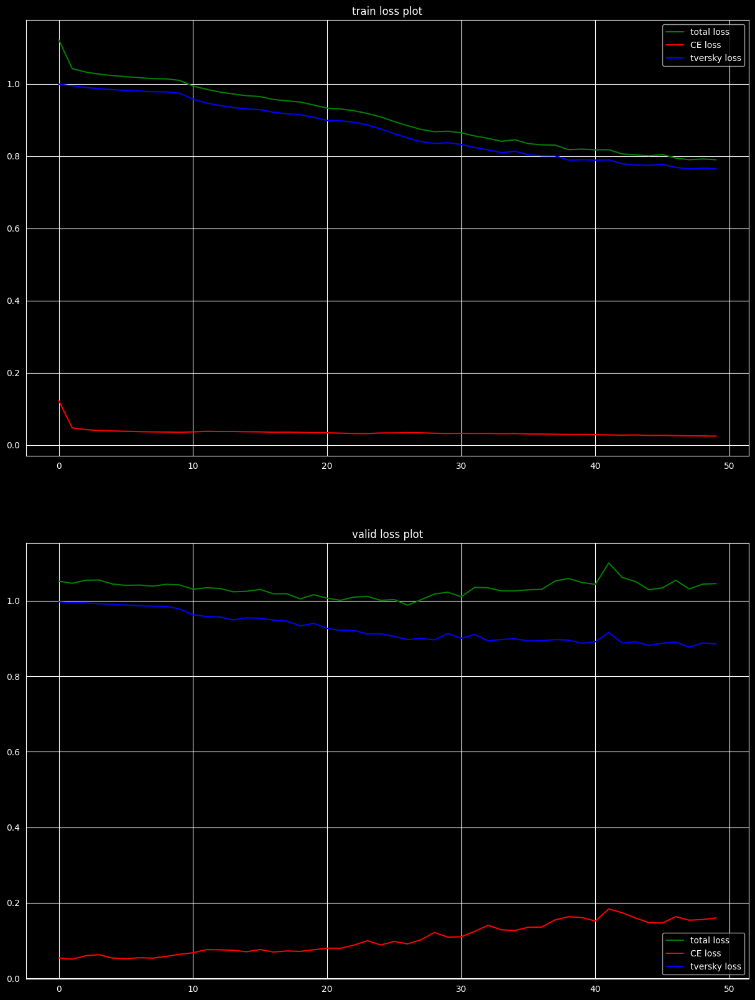

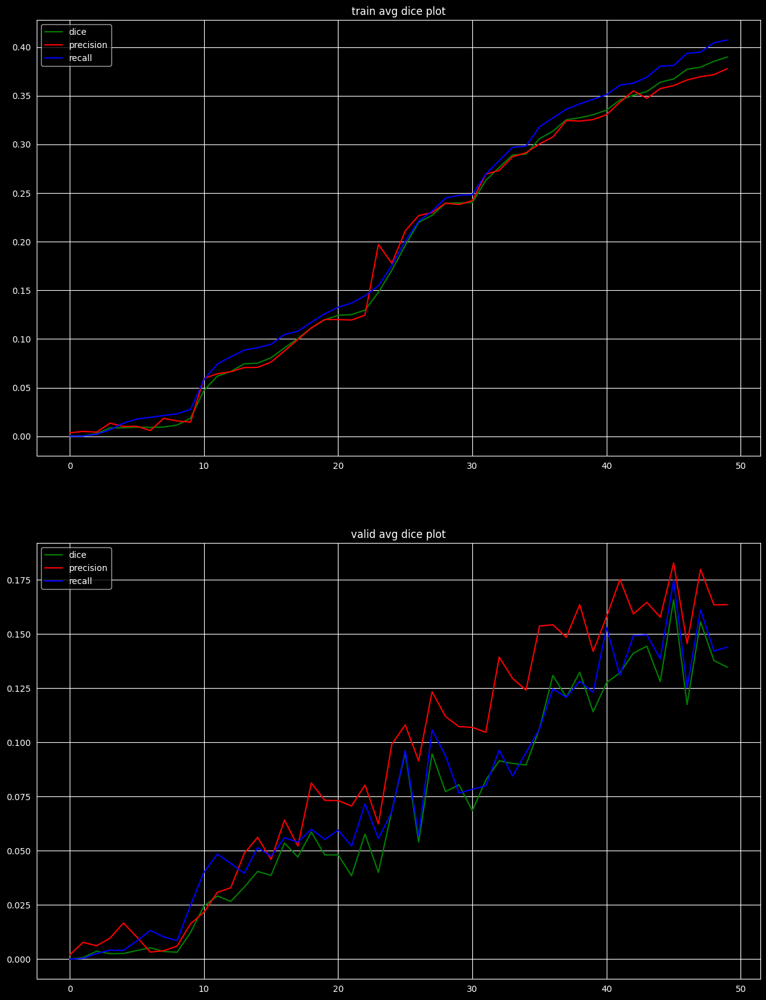

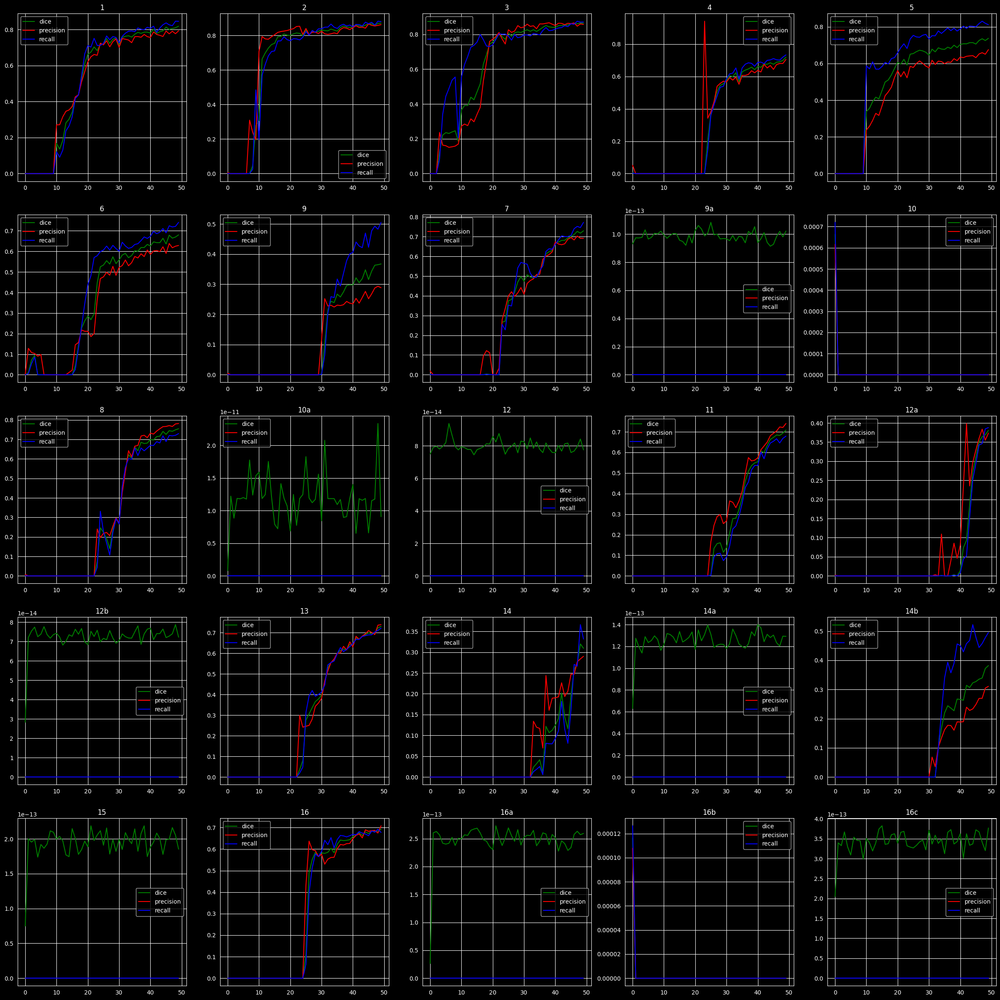

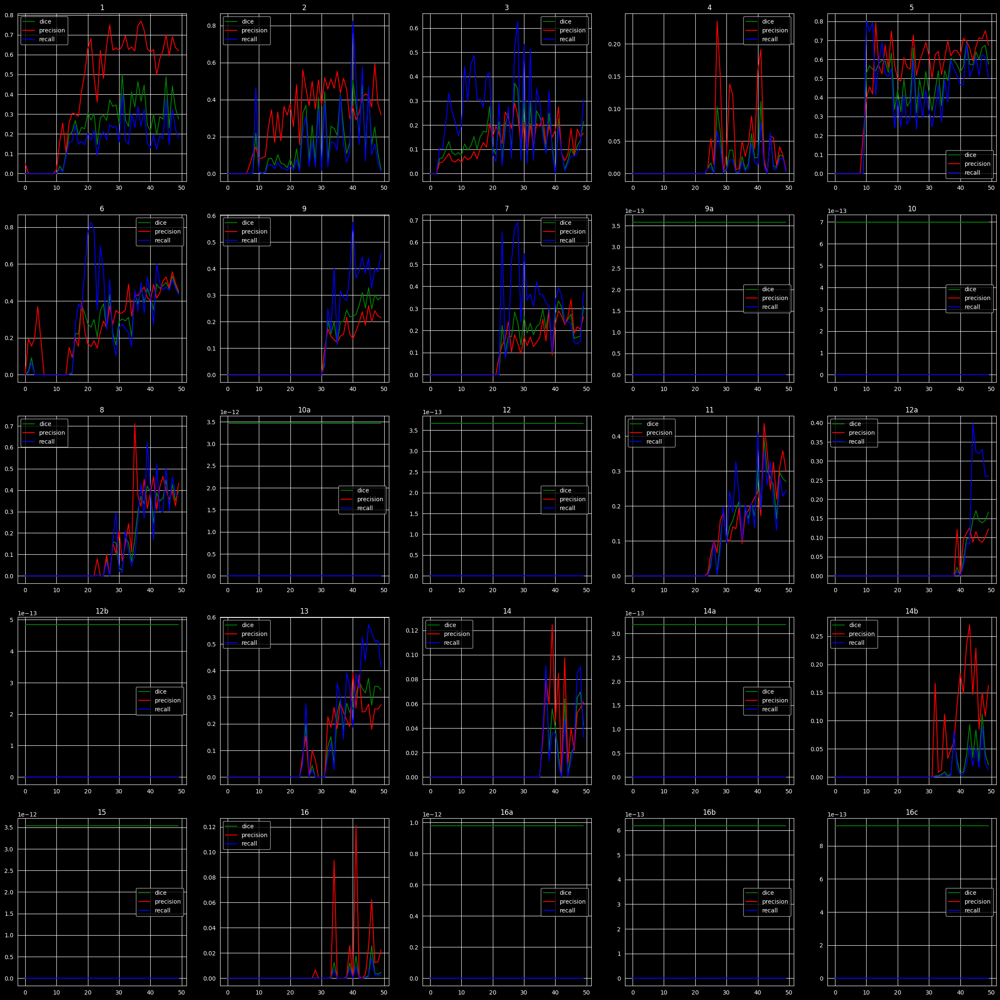

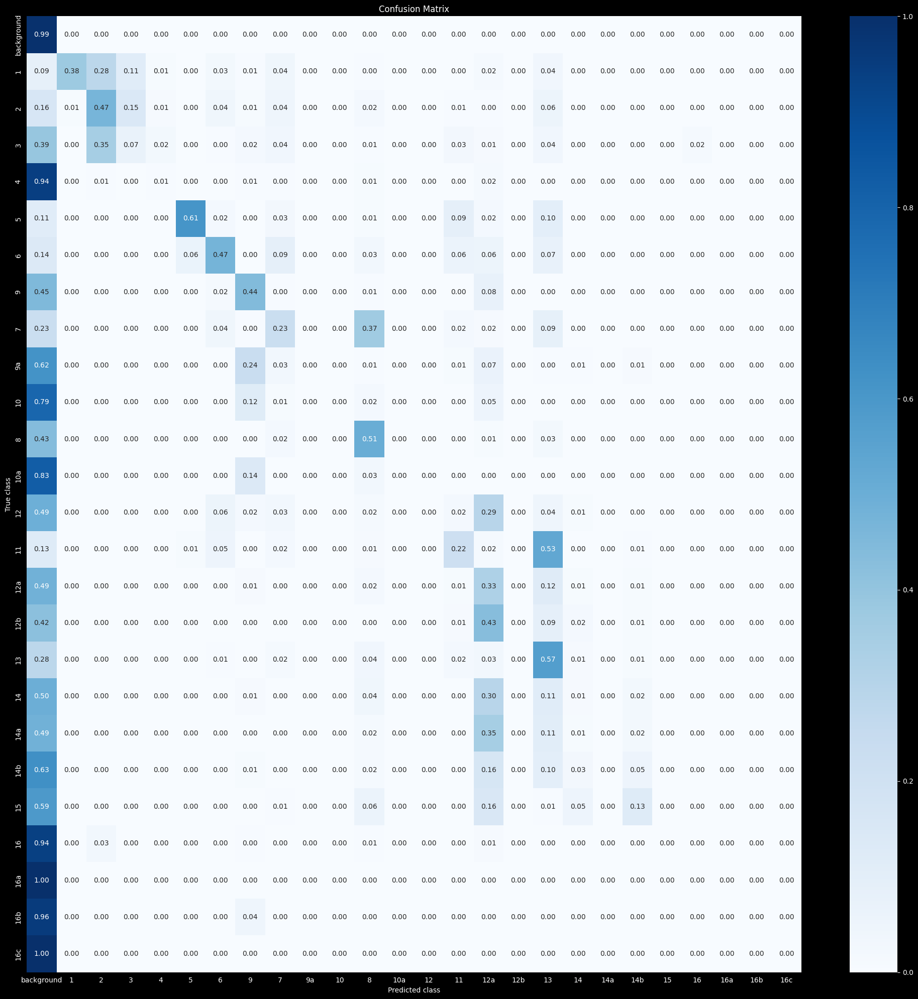

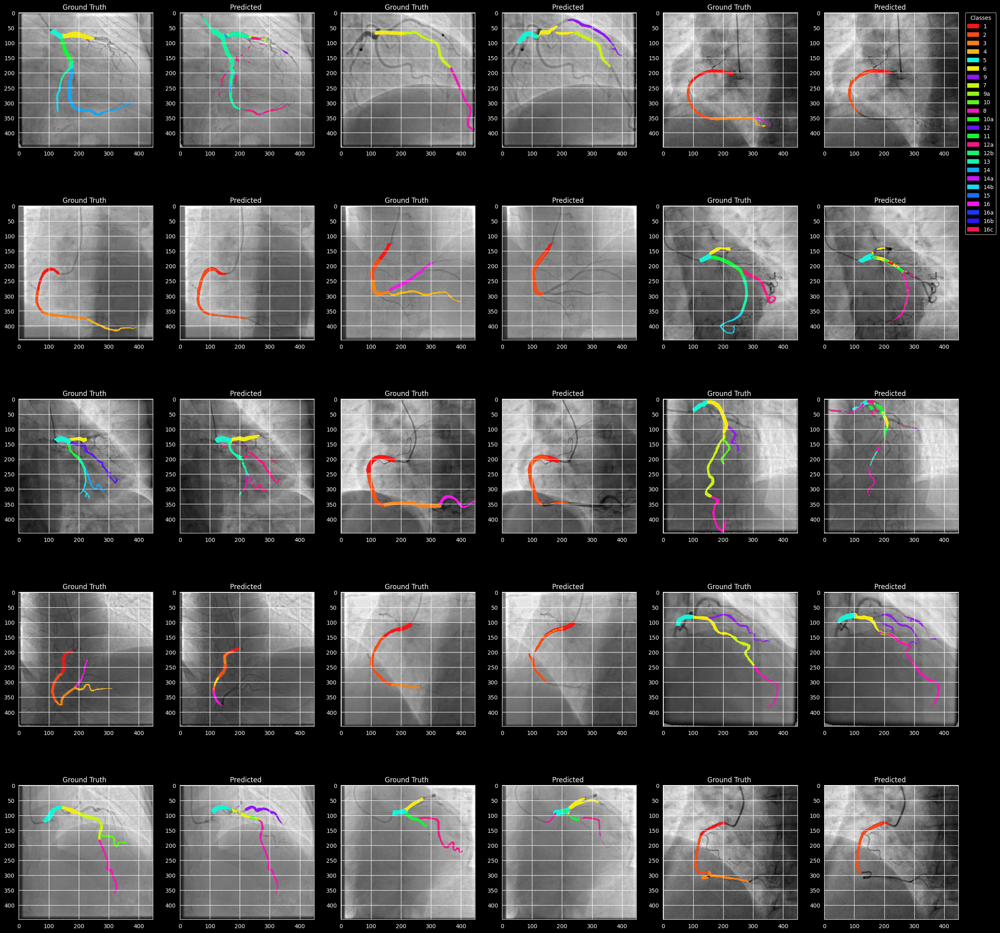

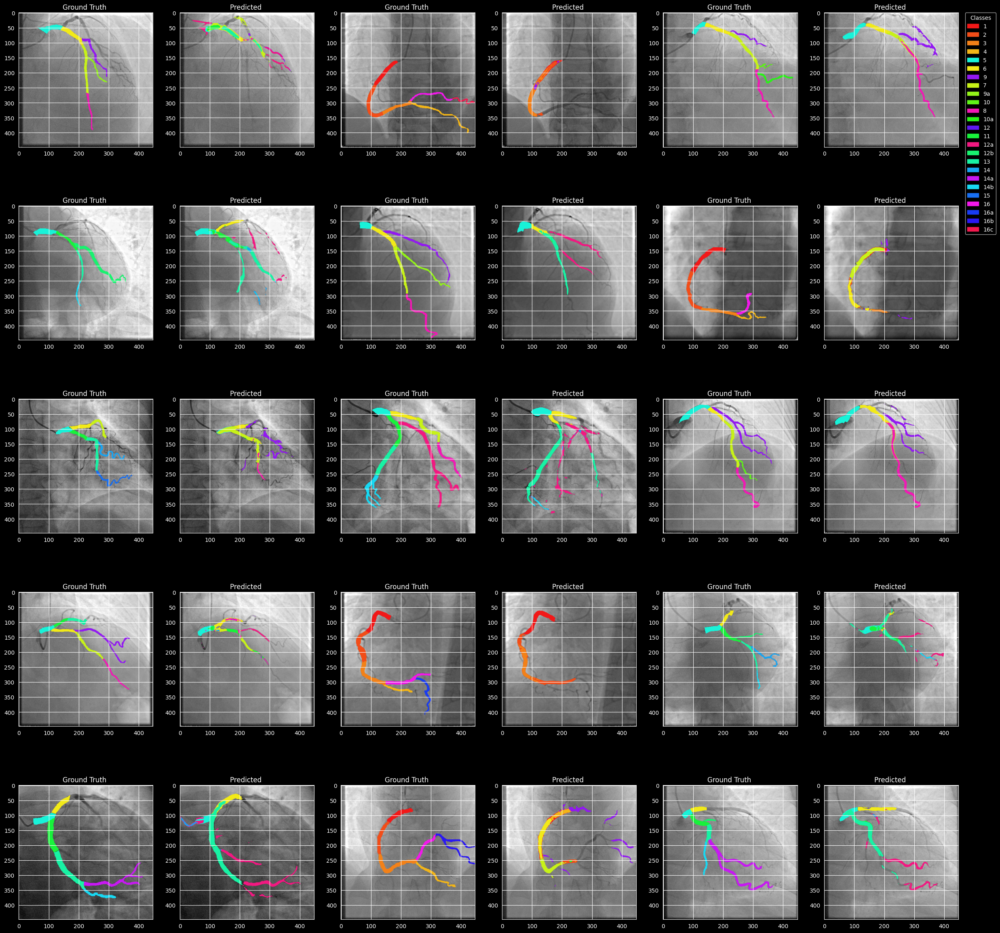

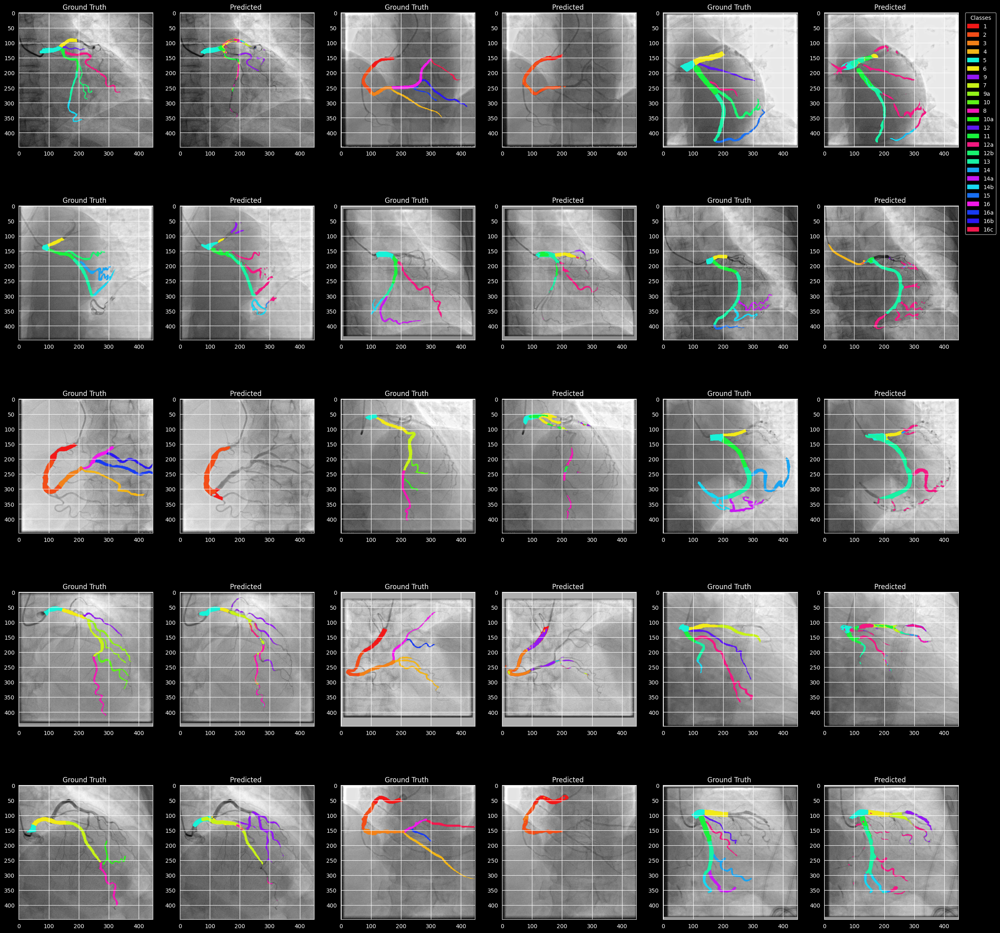

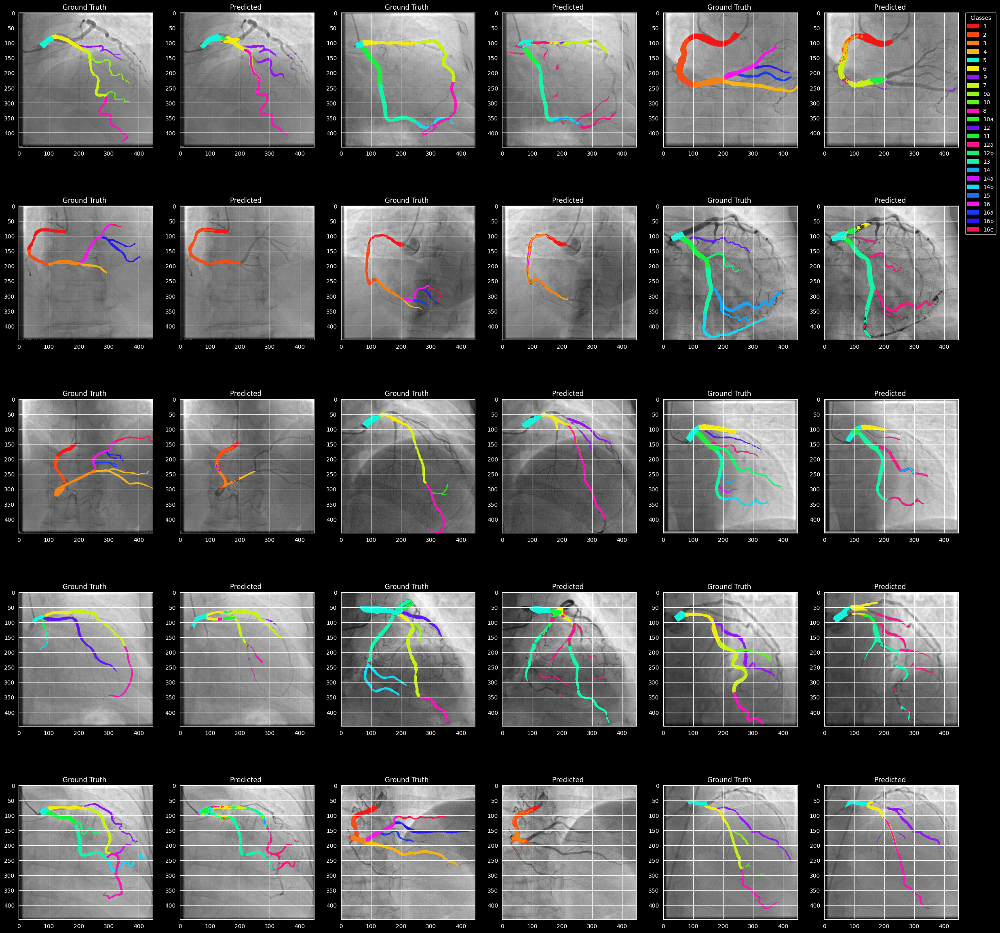

In [11]:
save_full_report(
    recorder= recorder , 
    output_base_path=args["output_base_path"],
    model=best_model,
    valid_loader=valid_loader,
    args=args,
    class_map=class_map,
    name=args["name"],
    valid_images = valid_images,
    test_transforms = test_transforms,
    notebook_name = "Multi_Main.ipynb",
    class_count = args["class_count"],
    device = args["device"]
)